# Проект
# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место и какими будут расположение. Требуется подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Предобработка данных

In [1]:
# импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go

In [2]:
# загружаем датасет
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Видим, что в датасете 14 колонок, в 6-ти из них - пропуски. Пропуски, на мой взгляд, заполнять некорректно. Поэтому оставим их как есть, хоть в некоторых колонках их очень много. Тип данных колонок - верен

In [4]:
# посмотрим сколько заведений представлено
data['name'].nunique()

5614

In [5]:
# посмотрим дубликаты
data.duplicated().sum()

0

Уникальных заведений 5614. А дубликатов в таблице .нет -  отлично. 

In [6]:
# проверим неявные дубликаты в тех колонках, в которых это актуально
print(data['name'].unique())
print()
print(data['category'].unique())
print()
print(data['district'].unique())
print()
print(data['hours'].unique())

['WoWфли' 'Четыре комнаты' 'Хазри' ... 'Миславнес' 'Самовар' 'Kebab Time']

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']

['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']


По неявным дубликатам тоже всё норм

In [7]:
# создадим новый столбец с названием улицы

data['street'] = data['address'].str.split(',').str[1]
# удалим пробелы в начале строки
data['street'] = data['street'].str.strip()

In [9]:
data['hours']

0                                  ежедневно, 10:00–22:00
1                                  ежедневно, 10:00–22:00
2       пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                                  ежедневно, 09:00–22:00
4                                  ежедневно, 10:00–22:00
                              ...                        
8401                               ежедневно, 09:00–02:00
8402                               ежедневно, 08:00–22:00
8403                             ежедневно, круглосуточно
8404                             ежедневно, круглосуточно
8405                             ежедневно, круглосуточно
Name: hours, Length: 8406, dtype: object

In [10]:
# создадим новый столбец с обозначением, что заведение работает 24/7
# для этого напишем функцию
def hour(row):
    if row=='ежедневно, круглосуточно':
        return 'True'
    else:
        return 'False'

In [11]:
# применим функцию
data['is_24/7'] = data['hours'].apply(hour)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных

### Исследование количества объектов общественного питания по категориям

In [12]:
# посмотрим категории заведений
cat = data.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
cat

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [13]:
# построим круговую диаграмму
go.Figure(data=[go.Pie(labels=cat['category'], values=cat['name'])], 
          layout=go.Layout(title=go.layout.Title(text="Категории заведений")))

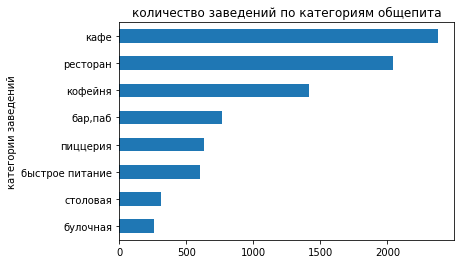

In [14]:
# построим график распределения
data['category'].value_counts(ascending=True).plot(kind='barh', title='количество заведений по категориям общепита',\
                                                   xlabel='категории заведений');

всего 8 категорий заведений общепита: от булочной до ресторана. Больше всего - кафе(2378) и ресторанов(2043), меньше всего - булочных(всего 256)

### Исследование количества посадочных мест в местах по категориям

In [15]:
# посмотрим сколько суммарно в категориях посадочных мест и какая у них медиана
data.pivot_table(index='category', values='seats', aggfunc={'sum', 'median'}).sort_values(by='median')

,median,sum
category,,
булочная,50.0,13229.0
пиццерия,55.0,40350.0
кафе,60.0,118770.0
быстрое питание,65.0,34513.0
столовая,75.5,16359.0
кофейня,80.0,83511.0
"бар,паб",82.5,58281.0
ресторан,86.0,154869.0


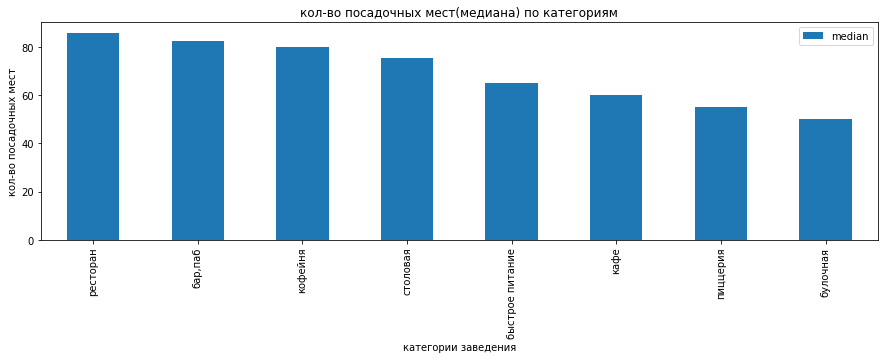

In [16]:
# на графике
data.pivot_table(index='category', values='seats', aggfunc={'median'}).sort_values(by='median', ascending=False)\
            .plot(kind='bar', figsize=(15,4), xlabel='категории заведения', ylabel='кол-во посадочных мест', title='кол-во посадочных мест(медиана) по категориям');

Больше всего посадочных мест у ресторанов. Меньше  - у булочных

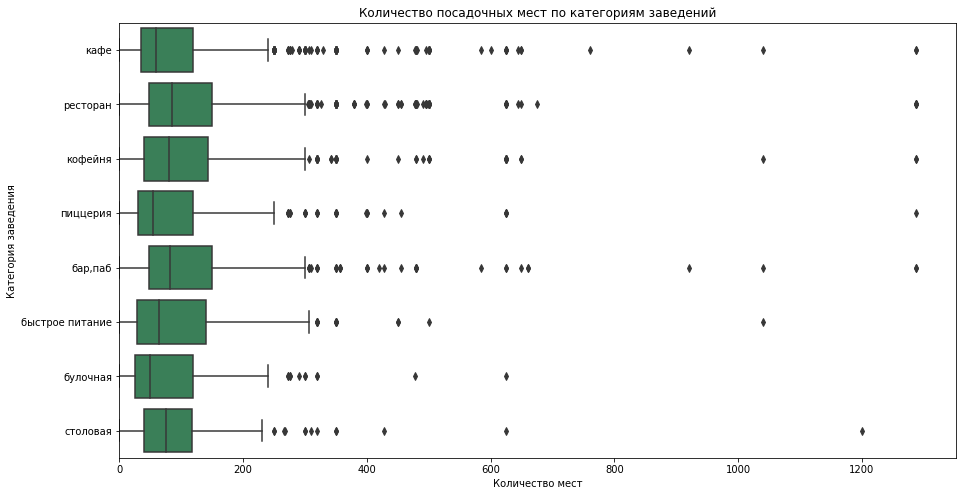

In [17]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=data, x='seats', y='category', color="seagreen")
ax.set_xlim(0)
plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Количество мест')
plt.ylabel('Категория заведения')
plt.show()

По графикам видно, что в булочных и пиццериях медиана смещается к нулю, так как бывают помещения и без посадочных мест, в остальных случаях кол-во посадочных мест около 60 и больше

### Исследование соотношения сетевых и несетевых заведений

In [18]:
# посчитаем кол-во сетевых и несетевых заведений
chain_data = data['chain'].value_counts().reset_index()
chain_data

,index,chain
0,0,5201
1,1,3205


Видно, что несетевых заведений гораздо больше сетевых.

In [19]:
# посмотрим тоже самое на графике
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain_data['chain'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

Исходя из соотношения и графика - выходит, что несетевых(62%) заведений общепита больше, чем сетевых(38%)

In [20]:
# рассмотрим какие категории заведений чаще являются сетевыми
new_data = data.query('chain==1').groupby('category')['name'].count().sort_values(ascending=False)
new_data

category
кафе               779
ресторан           730
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            169
булочная           157
столовая            88
Name: name, dtype: int64

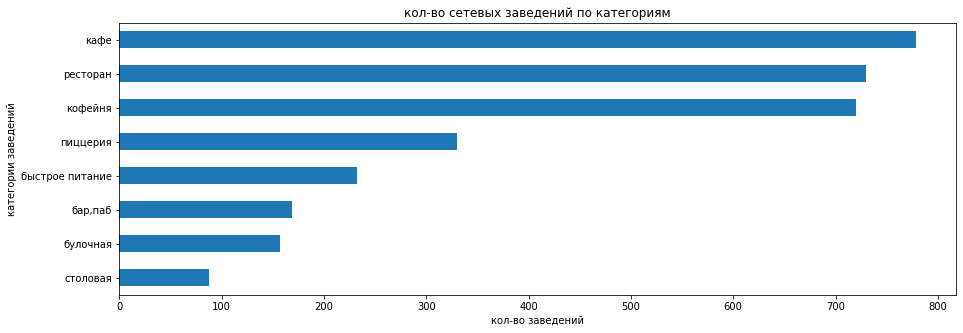

In [21]:
# посмотрим на графике
plt.figure(figsize=(15,5))
new_data.sort_values(ascending=True).plot(kind='barh')
plt.title('кол-во сетевых заведений по категориям')
plt.ylabel('категории заведений')
plt.xlabel('кол-во заведений');

Из графика и расчетов видно, что чаще всего сетевыми заведениями являются кафе (779), рестораны (730) и кофейни (720). Реже всего - столовые (88).

### Топ-15 популярных сетей в Москве

In [65]:
# найдём топ-15 популярных сетей в Москве
top_15 = data.query('chain==1').groupby('name')['address'].count().sort_values(ascending=False).head(15)
top_15

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
CofeFest                                32
Буханка                                 32
Му-Му                                   27
Name: address, dtype: int64

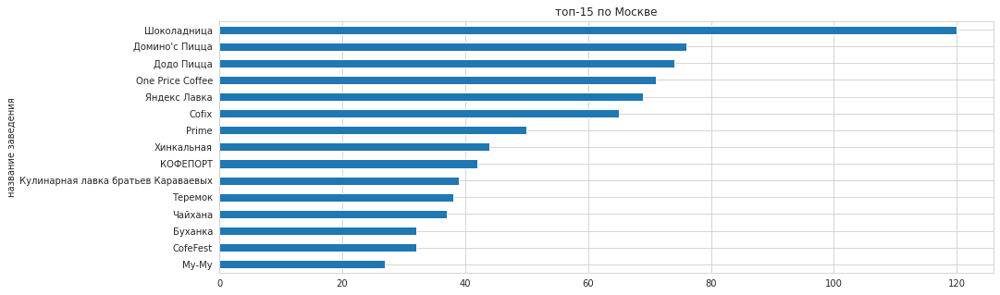

In [66]:
top_15.sort_values(ascending=True).plot(kind='barh', figsize=(15,5), title='топ-15 по Москве', xlabel='название заведения');

Вот так выглядит топ-15 в Москве. Абсолютный лидер - Шоколадница. Конечно, эти заведения всем знакомы. Сюда попали и кафе и кофейни и пиццерии(см. ниже)

In [67]:
names = top_15.index
names

Index(['Шоколадница', 'Домино'с Пицца', 'Додо Пицца', 'One Price Coffee',
       'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ',
       'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана', 'CofeFest',
       'Буханка', 'Му-Му'],
      dtype='object', name='name')

In [68]:
# посмотрим в каких категориях находятся эти заведения
for name in names:
    a = data[data['name']==name]['category'].unique()
    print(name,a)

Шоколадница ['кофейня' 'кафе']
Домино'с Пицца ['пиццерия']
Додо Пицца ['пиццерия']
One Price Coffee ['кофейня']
Яндекс Лавка ['ресторан']
Cofix ['кофейня']
Prime ['ресторан' 'кафе']
Хинкальная ['быстрое питание' 'кафе' 'ресторан' 'столовая' 'бар,паб']
КОФЕПОРТ ['кофейня']
Кулинарная лавка братьев Караваевых ['кафе']
Теремок ['ресторан' 'быстрое питание']
Чайхана ['кафе' 'быстрое питание' 'ресторан']
CofeFest ['кофейня' 'кафе']
Буханка ['булочная' 'кофейня' 'кафе']
Му-Му ['кафе' 'ресторан' 'кофейня' 'быстрое питание' 'пиццерия' 'столовая'
 'бар,паб']


Как видно, что в топ-15 попали заведения из разных категорий: кафе, ресторан, пиццерия, кофейня. 

In [84]:
# отфильтруем датасет (возьмем только сетевые заведения)
data_chain=data.groupby(['name','district'], as_index=False)['address'].count().sort_values(by='address', ascending=False)
data_chain = data_chain[data_chain['name'].isin(top_15.index)]
data_chain.head()

,name,district,address
6597,Шоколадница,Центральный административный округ,38
1525,Prime,Центральный административный округ,37
3935,Кулинарная лавка братьев Караваевых,Центральный административный округ,32
501,Cofix,Центральный административный округ,20
6593,Шоколадница,Западный административный округ,17


In [86]:
# попробуем построить график для выявления зависимости
fig = px.bar(data_chain, # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y                
             color='district'
            )
# оформляем график
fig.update_layout(title='Кол-во заведений разных сетей',
                   xaxis_title='Кол-во заведений',
                   yaxis_title='Сеть заведения',
                 yaxis={'categoryorder':'total ascending'})
                  
fig.show() # выводим график

 Возможно, заведения объединяет то, что в основном они сосредоточены в ЦАО? И немногим меньше в ЗАО

In [87]:
# отфильтруем датасет (возьмем только сетевые заведения)
data_chain=data.groupby(['name','category'], as_index=False)['address'].count().sort_values(by='address', ascending=False)
data_chain = data_chain[data_chain['name'].isin(top_15.index)]
data_chain.head()

,name,category,address
5943,Шоколадница,кофейня,119
2750,Домино'с Пицца,пиццерия,76
2714,Додо Пицца,пиццерия,74
1214,One Price Coffee,кофейня,71
6019,Яндекс Лавка,ресторан,69


In [89]:
# попробуем построить график для выявления зависимости
fig = px.bar(data_chain, # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y                
             color='category'
            )
# оформляем график
fig.update_layout(title='Кол-во заведений разных сетей и их категории',
                   xaxis_title='Кол-во заведений',
                   yaxis_title='Сеть заведения',
                 yaxis={'categoryorder':'total ascending'})
                  
fig.show() # выводим график

Лидер - шокладница. Большая часть заведений относятся к категориям: кофейня, пиццерия и быстрое питание

### Исследование общего количества заведений и количества заведений каждой категории по районам

In [28]:
# Какие административные районы Москвы присутствуют в датасете?
dist = data['district'].unique()
dist

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Всего 9 округов в Москве. Далее посмотрим кол-во заведений по округам

In [29]:
# посчитаем сколько всего заведений в каждом районе Москвы
data.pivot_table(index='district',  values='name', aggfunc='count').sort_values(by='name',ascending=False)

,name
district,
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


В ЦАО ожидаемо больше всего заведений, причем с большим преимуществом.

In [30]:
# найдем кол-во заведений в категориях по районам
for_graph = data.groupby(['district', 'category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
for_graph

,district,category,name
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [31]:
# посмотрим на график распределения кол-ва заведений по районам и категориям
fig = px.bar(for_graph, # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y                
             color='category'
            )
# оформляем график
fig.update_layout(title='Кол-во заведений каждой категории по районам',
                   xaxis_title='Кол-во заведений',
                   yaxis_title='Округ',
                 yaxis={'categoryorder':'total ascending'})
                  
fig.show() # выводим график

ЦАО по количеству заведений заметно выделяется на фоне остальных. Больше всего там ресторанов (причем дорогих, скорее всего - посмотрим по среднему чеку).

###  Исследование распределения средних рейтингов по категориям заведений

In [32]:
# посмотрим на распределение средних рейтингов по категориям заведений
data.pivot_table(index='category', values='rating').sort_values(by='rating', ascending=False).round(2)

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


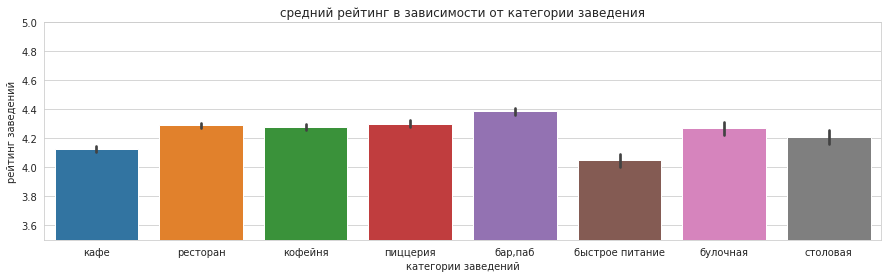

In [33]:
# построим график рейтингов заведений
plt.figure(figsize=(15,4))
sns.set_style('whitegrid')
#sns.set_ylim(3.5, 5)
sns.barplot( x='category', y='rating', data=data).set(ylim=(3.5,5))
plt.title('средний рейтинг в зависимости от категории заведения')
plt.xlabel('категории заведений')
plt.ylabel('рейтинг заведений');

И по расчёту и по графику видно, что средний рейтинг заведений разной категории отличается незначительно. На фоне всех относительно выделяется только рейтинг быстрого питания - в худшую сторону(4.05)

### Построение фоновой картограммы (хороплета) со средним рейтингом заведений каждого района

In [34]:
# посмотрим средний рейтинг заведений каждого района
rating_data = data.groupby('district', as_index=False)['rating'].mean().round(2)
rating_data

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [35]:
# построим хороплет
# импортируем карту и хороплет,  а также маркер
from folium import Map, Choropleth,  Marker

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Рейтинг заведений в ЦАО - самый высокий (4.38). Также выделяется аутсайдер - ЮВАО с рейтингом 4.10. А вообще разница в рейтингах, на мой взгляд, незначительная

### Отображение всех заведений датасета на карте с помощью кластеров 

In [36]:
# отобразим все заведения датасета на карте
# импортируем кластер
from folium.plugins import MarkerCluster
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)
# выводим карту
m

### Топ-15 улиц по количеству заведений

In [37]:
# посмотрим на улицы с самым большим кол-вом заведений
top_street = data.groupby('street',as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False).head(15)
top_street.reset_index()


,index,street,name
0,1090,проспект Мира,184
1,773,Профсоюзная улица,122
2,1087,проспект Вернадского,108
3,525,Ленинский проспект,107
4,523,Ленинградский проспект,95
5,373,Дмитровское шоссе,88
6,455,Каширское шоссе,77
7,298,Варшавское шоссе,76
8,524,Ленинградское шоссе,70
9,550,МКАД,65


Проспект Мира вырывается вперед со 184 заведениями)))

In [38]:
# посмотрим на распределение кол-ва заведений и их категорий по улицам
top_graph = data.groupby(['street', 'category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
top_graph

,street,category,name
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1
1535,Мукомольный проезд,пиццерия,1


In [39]:
# отберем данные топ-15 улиц для графика
top15_street = top_graph[top_graph['street'].isin(top_street['street'])]
top15_street

,street,category,name
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
2843,проспект Вернадского,булочная,1
1365,Люблинская улица,пиццерия,1
1378,МКАД,"бар,паб",1
1383,МКАД,столовая,1


In [40]:
# посмотрим график
fig = px.bar(top15_street, # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='street', # указываем столбец с данными для оси Y               
             color='category'
            )
# оформляем график
fig.update_layout(title='Распределение заведений каждой категории по улицам',
                   xaxis_title='Кол-во заведений',
                   yaxis_title='Улицы',
                   yaxis={'categoryorder':'total ascending'}
                  
                 )
fig.show() # выводим график

Проспект Мира - улица с наибольшим количеством заведений на ней (184). Больше всего там - кафе (53), ресторанов (45) и кофеен (36). 

### Улицы, на которых находится только один объект общепита

In [41]:
# найдем эти улицы
one_name = data.groupby('street', as_index=False)['name'].count().sort_values(by='name')
one_name[one_name['name']==1]['street'].unique()

array(['1-й Автозаводский проезд', 'Одинцовская улица',
       'Октябрьский переулок', 'Ордынский тупик', 'Оренбургская улица',
       'Орловский переулок', 'Оршанская улица', 'Островная улица',
       'Новоясеневский тупик', 'Отрадный проезд',
       'Панкратьевский переулок', 'Парусный проезд', 'Певческий переулок',
       'Переведеновский переулок', 'Перекопская улица', 'Пермская улица',
       'Перовский парк культуры и отдыха', 'Павелецкая набережная',
       'Новощукинская улица', 'Новосущёвская улица',
       'Новороссийская улица', 'Малый Толмачёвский переулок',
       'Мансуровский переулок', 'Медовый переулок',
       'Мерзляковский переулок', 'Миусская площадь',
       'Михайловский проезд', 'Молдавская улица',
       'Москворецкая набережная', 'Московская улица',
       'Московский проспект', 'Мурановская улица', 'Мясницкий проезд',
       'Нащокинский переулок', 'Новая улица', 'Новгородская улица',
       'Новомосковская улица', 'Новопоселковая улица',
       'Пестовский п

In [42]:
# посчитаем их количество
one_name[one_name['name']==1]['street'].nunique()

458

Итого: 458 улицы с 1 заведением. Думаю это маленькие и непопулярные улицы

Подскажи, пожалуйста, для проверки написала код ниже - и он не работает, ни через Loc, ни через query. Почему?

### Анализ среднего чека

In [44]:
# посчитаем медиану среднего чека для каждого района
median_bill = data.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)
median_bill.reset_index()

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


По полученным данным видно, что самый большой средний чек в двух округах: Западном и Центральном. Самый маленький - в Юго-Восточном

In [45]:
# построим хороплет
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m


Вообще, чем дальше от центра - тем чек меньше, но только не для западного округа. Там живут состоятельные люди, поэтому и чек большой) Ну и плюс в аэропорте Внуково также максимальный чек

## Детализируем исследование: открытие кофейни

In [46]:
# посчитаем кол-во кофеен в датасете? 
cofee = data[data['category']=='кофейня']
cofee['name'].count()

1413

In [47]:
# В каких районах их больше всего, каковы особенности их расположения?
cofee.groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: name, dtype: int64

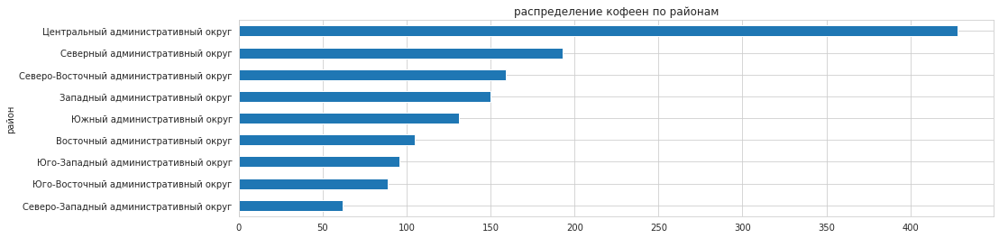

In [48]:
# посмотрим на графике
cofee.groupby('district')['name'].count().sort_values(ascending=True).plot(kind='barh', title='распределение кофеен по районам',\
                                                                          xlabel='район', figsize=(15,4));

In [49]:
# есть ли круглосуточные кофейни?
cofee[cofee['is_24/7']=="True"]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,Дмитровское шоссе,True
971,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,Ярославское шоссе,True
1047,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Ярославское шоссе,True
1214,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,МКАД,True
1291,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица Народного Ополчения,True
1468,Кофе Хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,Ленинградский проспект,True
1790,Кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,Ленинградский проспект,True
1825,You&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица Золоторожский Вал,True
1883,Кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,Лесная улица,True
2030,Cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,Долгоруковская улица,True


In [50]:
# посчитаем кол-во круглосуточных кофеен
cof = cofee[cofee['is_24/7']=="True"]['name'].count()
print('кол-во круглосуточных кофеен', cof)

кол-во круглосуточных кофеен 59


In [51]:
# посмотрим кол-во круглосуточных кофеен по районам
cofee[cofee['is_24/7']=="True"].groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Восточный административный округ            5
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
Name: name, dtype: int64

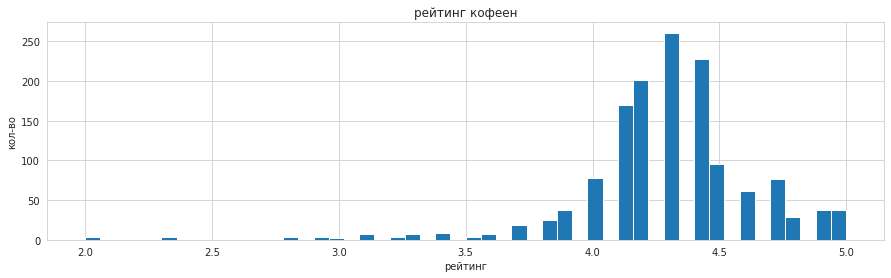

In [52]:
# посмотрим рейтинг кофеен
cofee['rating'].hist(bins=50, figsize=(15,4), range=(2, 5));
plt.title('рейтинг кофеен')
plt.xlabel('рейтинг')
plt.ylabel('кол-во');


Большинство кофеен с рейтингом примерно 4.3, хотя встречаются и с "двойками" и "пятерками"

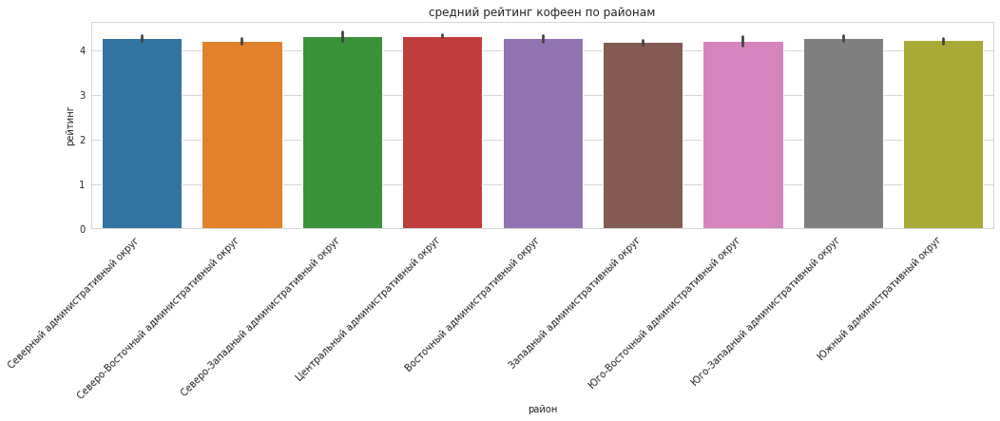

In [53]:
# посмотрим рейтинги кофеен по районам
plt.figure(figsize=(17,4))
plt.xticks(rotation=45, ha='right')
sns.barplot(x='district', y='rating', data=cofee)
plt.title('средний рейтинг кофеен по районам')
plt.xlabel('район')
plt.ylabel('рейтинг');

По районам рейтинги кофеен отличаются незначительно. Чуть меньше, чем у остальных рейтинги у С-В и Западного округа.

In [54]:
# рейтинги кофеен  по районам
fig = px.scatter(cofee, 
                y='district',
                x='rating')
fig.update_layout(title = 'рейтинг кофеен по районам',
                  xaxis_title='рейтинг',
                  yaxis_title='район')
fig.show()

Видим, что у Восточного и Юго-Западного района нет рейтинга кофейни ниже 3.

In [55]:
# На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
cofee['middle_coffee_cup'].mean()

175.0556621880998

Средняя стоимость чашки кофе равна 175. Но грамотнее будет посмотреть цены в зависимости от района

In [56]:
# анализ стоимости чашки кофе в разных районах Москвы
order = cofee.groupby('district')['middle_coffee_cup'].mean().round(2).sort_values(ascending=False)
order

district
Западный административный округ            189.94
Центральный административный округ         187.52
Юго-Западный административный округ        184.18
Восточный административный округ           174.02
Северный административный округ            165.79
Северо-Западный административный округ     165.52
Северо-Восточный административный округ    165.33
Южный административный округ               158.49
Юго-Восточный административный округ       151.09
Name: middle_coffee_cup, dtype: float64

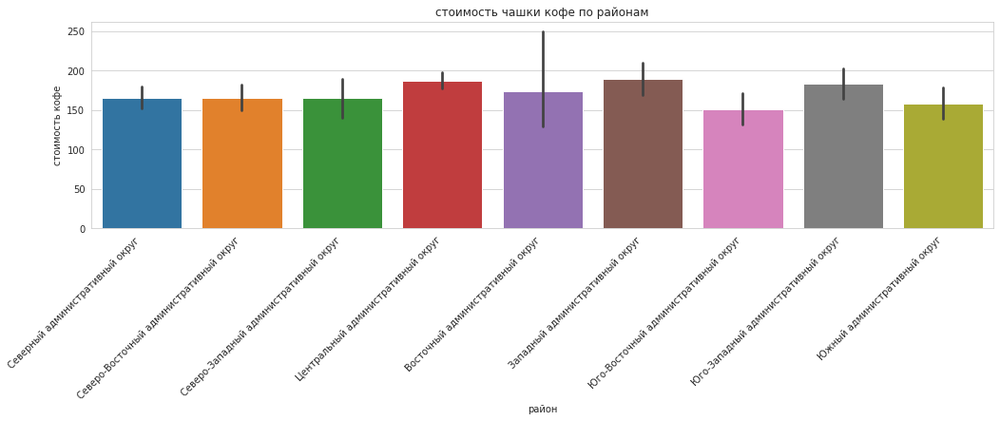

In [57]:
# для наглядности график
plt.figure(figsize=(17,4))
plt.xticks(rotation=45, ha='right')
sns.barplot(x='district', y='middle_coffee_cup', data=cofee)
plt.title('стоимость чашки кофе по районам')
plt.xlabel('район')
plt.ylabel('стоимость кофе');

Не работает сортировка в параметре order=cofee.sort_values('middle_coffee_cup', ascending=False) почему-то((( 

Самая дорогая чашка кофе - в Западном округе. Чуть дешевле - в ЦО и ЮЗО. Самая дешевая - в ЮВО.

Исходя из всего вышеперечисленного, я бы советовала открывать кофейню  в Западном округе в связи с небольшой конкуренцией (всего 150, а в ЦО - 428) и опираясь на среднюю стоимость чашки капучино (190 рублей). Для большей прибыли можно попробовать открыть круглосуточную кофейню.

## Вывод

По полученным данным и построенным графикам видно, что:
- Всего в Москве 5614 заведений общественного питания
- Лидером по количеству завдений являются кафе(2378) - 28% всей численности общепитов, немного уступают им - рестораны (2043) - 24%. А булочных в Москве меньше всего - лишь 256(3%)
- Несетевых(62%) заведений общепита больше, чем сетевых(38%). А чаще всего сетевыми являются кафе
- Выделяется топ-15 заведений, коими являются: 
        'Шоколадница', 'Домино'с Пицца', 'Додо Пицца', 'One Price Coffee',
       'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ',
       'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана', 'CofeFest',
       'Буханка', 'Му-Му'. 
Все заведения реально популярные - из-за меню + доступный ценник
- В Москве существует 9 округов: 
        Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'
И самое большое количество заведений, конечно же в Центральном округе - 2242 с преобладанием ресторанов и кафе. 
Самое малое - в Северо-Западном  - 409.
- Если смотреть на рейтинги заведений по категориям - то самый высокий у баров, пабов(4.39), а низкий - у быстрого питания(4.05). В целом средний рейтинг отличается несущественно. В разрезе районов - самый высокий ретинг у заведений в ЦАО(4.38), а низкий - в ЮВАО(4.10), что можем увидеть на карте распределения рейтингов.
- 15 улиц с набольшим кол-вом заведений являются: 
проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект, Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова, Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица.
Из них Проспект Мира - абослютный лидер со 184 заведениями, в которых преобладают кафе и рестораны.
- Но также существуют и улицы с 1 заведением, всего таких - 458
- Средний чек максимален в ЦАО и ЗАО - 1000, и в зависимости от удаленности от центра - падает. В ЮВАО - минимальный(450)
- Что касается открытия кофейни...
    - Кофеен в Москве достаточно много - 1413 - 17% от всего количества общепита и занимает 3 место по численности. Если открывать кофейню, то точно не в ЮВАО - там минимальный средний чек. Исходя из представленных данных, я бы советовала открывать кофейню  в Западном округе в связи с небольшой конкуренцией (всего 150, а в ЦО - 428) и опираясь на среднюю стоимость чашки капучино (190 рублей). Для большей прибыли можно попробовать открыть круглосуточную кофейню.